# Setup 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft2, ifft2
from scipy.integrate import solve_ivp
import time

# Define parameters
tspan = np.arange(0, 4.5, 0.5)
Lx, Ly = 20, 20
nx, ny = 64, 64
N = nx * ny
m = 64

spirals = 1
D1 = 0.1
D2 = 0.1
beta = 1

# Define spatial domain and initial conditions
x2 = np.linspace(-Lx/2, Lx/2, nx + 1)
x = x2[:nx]
y2 = np.linspace(-Ly/2, Ly/2, ny + 1)
y = y2[:ny]
X, Y = np.meshgrid(x, y)

#spiral initialization
u = np.tanh(np.sqrt(X**2 + Y**2)) * np.cos(spirals * np.angle(X + 1j * Y) - np.sqrt(X**2 + Y**2))
ut = fft2(u)
v = np.tanh(np.sqrt(X**2 + Y**2)) * np.sin(spirals * np.angle(X + 1j * Y) - np.sqrt(X**2 + Y**2))
vt = fft2(v)

# Define spectral k values
kx = (2 * np.pi / Lx) * np.concatenate((np.arange(0, nx/2), np.arange(-nx/2, 0)))
kx[0] = 1e-6
ky = (2 * np.pi / Ly) * np.concatenate((np.arange(0, ny/2), np.arange(-ny/2, 0)))
ky[0] = 1e-6
KX, KY = np.meshgrid(kx, ky)
K = -(KX**2 + KY**2)




# FFT

Elapsed time: 0.16 seconds


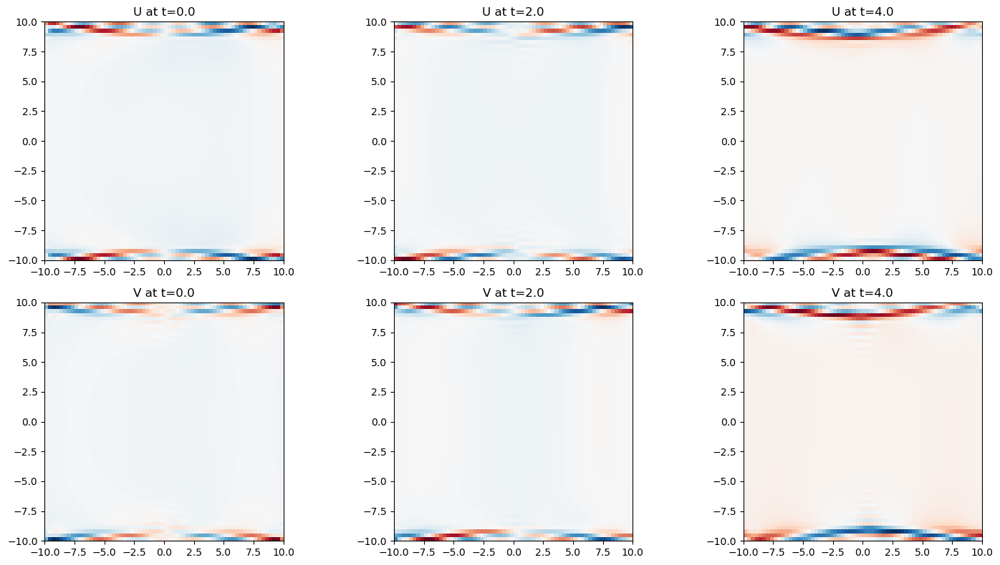

In [2]:
def rhs(t, vec):
    ut = vec[:N].reshape((nx, ny)) 
    vt = vec[N:].reshape((nx, ny)) 
    
    #Diffusion
    #uhat = fft2(u)
    u = ifft2(ut)
    
    #vhat = fft2(v)
    v = ifft2(vt)
    
    #Reaction
    A = np.sqrt(u**2 + v**2)
    lamb = 1 - A**2
    omega = -beta*A**2
    u_reaction = fft2(lamb*u - omega*v)
    v_reaction = fft2(omega*u + lamb*v)
    
    dudt = u_reaction + D1*K*ut
    dvdt = v_reaction + D2*K*vt
    
    return np.concatenate([dudt.flatten(), dvdt.flatten()])

start_time = time.time() # Record the start time
vec = np.concatenate([ut.flatten(),vt.flatten()])
#rd_sol = solve_ivp(rhs, [0,4], vec, t_eval = tspan, args=(nx, ny, N, KX, KY, K, spirals, D1, D2, beta))
rd_sol = solve_ivp(rhs, [0,4], vec, t_eval = tspan, method = 'RK45')
A1 = rd_sol.y

end_time = time.time() # Record the end time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time:.2f} seconds")


# plot
# Reshape and extract results for plotting
U_periodic = rd_sol.y[:N, :].reshape(nx, ny, -1)
U_periodic_ifft = np.real(ifft2(U_periodic))
V_periodic = rd_sol.y[N:, :].reshape(nx, ny, -1)
V_periodic_ifft = np.real(ifft2(V_periodic))

# Plot results at t=0, t=2, and t=4
time_indices = [0, 4, 8]  # Corresponding to t=0, t=2, t=4
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for i, t_idx in enumerate(time_indices):
    axes[0, i].imshow(U_periodic_ifft[:, :, t_idx], extent=(-10, 10, -10, 10), cmap='RdBu')
    axes[0, i].set_title(f"U at t={tspan[t_idx]:.1f}")
    axes[1, i].imshow(V_periodic_ifft[:, :, t_idx], extent=(-10, 10, -10, 10), cmap='RdBu')
    axes[1, i].set_title(f"V at t={tspan[t_idx]:.1f}")

plt.tight_layout()
plt.show()


# Chebychev

Elapsed time: 0.13 seconds


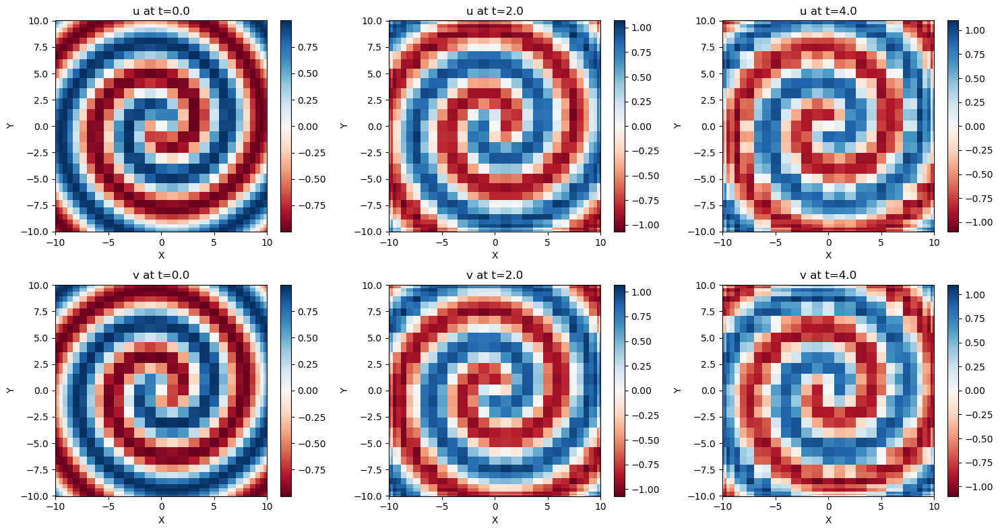

In [3]:
from scipy.linalg import kron

def cheb(N):
    if N==0: 
        D = 0.; x = 1.
    else:
        n = np.arange(0,N+1)
        x = np.cos(np.pi*n/N).reshape(N+1,1) 
        c = (np.hstack(( [2.], np.ones(N-1), [2.]))*(-1)**n).reshape(N+1,1)
        X = np.tile(x,(1,N+1))
        dX = X - X.T
        D = np.dot(c,1./c.T)/(dX+np.eye(N+1))
        D -= np.diag(np.sum(D.T,axis=0))
    return D, x.reshape(N+1)

N = 30
D, x = cheb(N)
D[N, :] = 0
D[0, :] = 0
D2 = np.dot(D, D)/((20/2)**2)
y = x

N2 = (N+1)*(N+1)
I = np.eye(len(D2))
L = kron(I, D2) + kron(D2, I)  # 2D Laplacian

X, Y = np.meshgrid(x, y)
X2 = X*(20/2)
Y2 = Y*(20/2)

spirals = 1
D1 = 0.1
D2 = 0.1
beta = 1

#spiral initialization
u = np.tanh(np.sqrt(X2**2 + Y2**2)) * np.cos(spirals * np.angle(X2 + 1j * Y2) - np.sqrt(X2**2 + Y2**2))
v = np.tanh(np.sqrt(X2**2 + Y2**2)) * np.sin(spirals * np.angle(X2 + 1j * Y2) - np.sqrt(X2**2 + Y2**2))


def cheb_solve(t, vec):
    u = vec[:N2]
    v = vec[N2:]
    
    #Reaction
    A = np.sqrt(u**2 + v**2)
    lamb = 1 - A**2
    omega = -beta*A**2
    
    dudt = D1*np.dot(L,u) + lamb*u - omega*v
    dvdt = D2*np.dot(L,v) + omega*u + lamb*v
    
    return np.concatenate([dudt.flatten(), dvdt.flatten()])

start_time = time.time() # Record the start time
vec = np.concatenate([u.flatten(),v.flatten()])

cheb_sol = solve_ivp(cheb_solve, [0,4], vec, t_eval = tspan, method = 'RK45')
A2 = cheb_sol.y

end_time = time.time() # Record the end time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time:.2f} seconds")


# Ensure variables tspan, D2, L, N2, X2, and Y2 are defined before plotting

# Reshape the solution for plotting
N = 30
time_indices = [0, len(tspan)//2, len(tspan)-1]  # Indices for t=0, t=2, t=4
u_sol = cheb_sol.y[:N2, :].reshape((N+1, N+1, -1))
v_sol = cheb_sol.y[N2:, :].reshape((N+1, N+1, -1))

fig, axes = plt.subplots(2, len(time_indices), figsize=(15, 8))

for i, t_idx in enumerate(time_indices):
    # Plot u
    pcm_u = axes[0, i].pcolor(
        X2, Y2, u_sol[:, :, t_idx],
        cmap='RdBu', shading='auto'
    )
    fig.colorbar(pcm_u, ax=axes[0, i])
    axes[0, i].set_title(f"u at t={tspan[t_idx]:.1f}")
    axes[0, i].set_xlabel("X")
    axes[0, i].set_ylabel("Y")
    
    # Plot v
    pcm_v = axes[1, i].pcolor(
        X2, Y2, v_sol[:, :, t_idx],
        cmap='RdBu', shading='auto'
    )
    fig.colorbar(pcm_v, ax=axes[1, i])
    axes[1, i].set_title(f"v at t={tspan[t_idx]:.1f}")
    axes[1, i].set_xlabel("X")
    axes[1, i].set_ylabel("Y")

plt.tight_layout()
plt.show()



# Movies

MovieWriter ffmpeg unavailable; using Pillow instead.


Elapsed time: 0.61 seconds


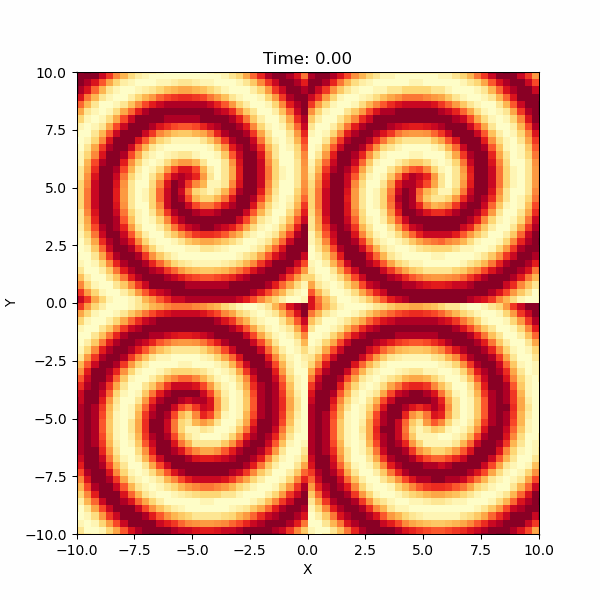

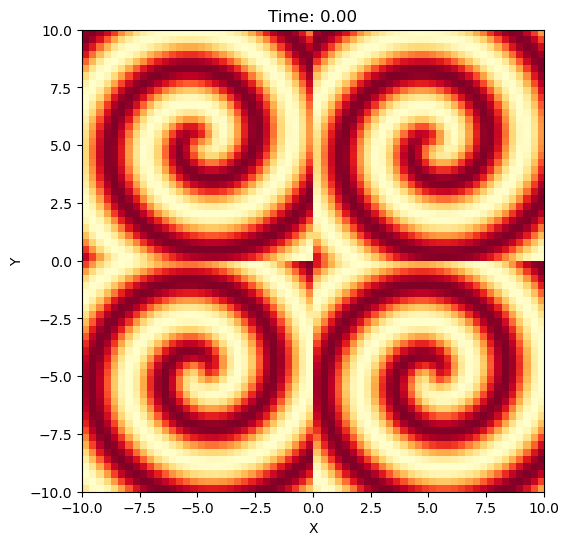

In [8]:
#import numpy as np
#import matplotlib.pyplot as plt
#import matplotlib.animation as animation
#from IPython.display import Image
#
#fig, ax = plt.subplots(figsize=(6, 6))
#
#tspan2 = np.arange(0, 100.5, 0.5)
#start_time = time.time() # Record the start time
#vec = np.hstack((u.reshape(N),v.reshape(N)))
#rd_sol = solve_ivp(rhs, [0,100], vec, t_eval = tspan2, args=(nx, ny, N, KX, KY, K, spirals, D1, D2, beta))
#A1 = rd_sol.y
#
#end_time = time.time() # Record the end time
#elapsed_time = end_time - start_time
#print(f"Elapsed time: {elapsed_time:.2f} seconds")
#
#rd_sol_reshape = np.real(rd_sol.y.reshape(m, m, -1))
#
#
## Function to update the plot for each frame in the animation
#def update_frame(i):
#    ax.clear()  # Clear the previous frame
#    #two oppositely charged
#    im = ax.imshow(rd_sol_reshape[:, :, i], extent=[-Lx/2, Ly/2, -Lx/2, Ly/2], origin='lower', cmap = 'YlOrRd')
#    
#    #two same charged
#    #im = ax.imshow(two_same_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#    
#    #two pairs
#    #im = ax.imshow(two_pair_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower', cmap = 'YlOrRd')
#    
#    #random vorticies
#    #im = ax.imshow(random_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#    
#    ax.set_title(f"Time: {tspan2[i]:.2f}")  # Display the current time step
#    ax.set_xlabel("X")
#    ax.set_ylabel("Y")
#    ax.set_aspect('equal')  # Ensure the plot is square
#
## Create the animation object
#ani = animation.FuncAnimation(fig, update_frame, frames=range(201), interval=100)
#
## Save and load the animation
#ani.save('opposites2.gif', writer='ffmpeg', fps=20)
#Image(open('opposites2.gif', 'rb').read())